In [20]:
# %pip install seaborn

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [22]:
# Set max columns to display
pd.set_option('display.max_columns', None)

In [23]:
#df_outlierHandling = pd.read_csv('/workspaces/codespaces-jupyter/Final Machine/Interpolated LIMS/df_outlierHandling.csv')

df_outlierHandling = pd.read_csv(r'C:\Users\austinsh\Project-OptiC4\IV Optimize\Continuous Data\adjusted_Limits.csv')

# Print descriptive statistics for df_outlierHandling
df_outlierHandling.describe()

,425_pct_Al,C4_pct_Eth,C4_pct_H2O,HydWtr_pct_Ammonia,HydWtr_Na2O,Butanol,Decanol,DI55102,DI55152,FC55003,FC55009,FC55552,FC55569,FC55576,FFC55555,LC55557,LC90366,LC90368,PI55004,PI55020,TC55552,TI55021
count,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,5.752700e+04,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000,57527.000000
mean,6.154646,1.406335,21.411447,0.987568,0.943615,11.710548,3.079622,0.942433,0.932708,6.000189e+03,839.351346,35354.755125,6623.538722,370.808207,0.771307,69.532496,45.699054,36.568201,2.254508,-1.416685,168.238142,223.817102
std,0.328672,2.890871,4.526890,0.206861,4.052631,15.262049,1.637239,0.054379,0.031861,1.034900e+03,613.080677,5702.776313,492.594343,254.400182,0.027059,3.122306,28.918576,20.276200,1.309684,1.153102,16.103761,11.503580
min,0.155707,0.001000,0.057000,0.070270,0.000000,0.000000,0.000000,0.800002,0.809662,1.930000e-17,0.000000,8271.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006367,0.001366,-5.655290,98.687500,73.404200
25%,6.008260,0.637724,18.825900,0.875995,0.458432,3.825155,1.827645,0.907534,0.912344,5.453440e+03,301.649000,33842.300000,6344.825000,197.434000,0.757451,67.034250,20.134600,19.728750,1.253675,-2.304505,155.269000,217.494000
50%,6.149170,1.148340,21.427500,0.943958,0.672371,5.993330,2.920000,0.947597,0.932860,6.005980e+03,816.394000,37916.900000,6579.030000,343.719000,0.771622,70.118300,46.481500,41.406600,1.927940,-1.386630,172.481000,220.434000
75%,6.310300,1.718210,23.315150,1.045175,0.992128,11.860050,4.086420,0.983472,0.952902,6.574890e+03,1317.990000,39006.700000,6833.430000,545.054000,0.788149,71.866150,76.916400,52.066800,3.071135,-0.393530,180.745000,224.527000
max,8.058320,77.165000,95.818000,3.744840,279.492000,99.950000,10.000000,1.120200,1.039590,1.470590e+04,2862.340000,52000.000000,10503.000000,1461.990000,0.998409,100.000000,87.901600,81.210800,12.531800,2.692840,203.179000,344.636000


In [24]:
num_columns = df_outlierHandling.shape[1]
print("Number of features:", num_columns)

Number of features: 23


In [25]:
# # Assuming df_outlierHandling is your DataFrame
# non_date_columns = df_outlierHandling.columns[df_outlierHandling.columns != 'Date']

# # Drop rows where any value (excluding 'Date') is 0 or less
# df_outlierHandling = df_outlierHandling.drop(df_outlierHandling[(df_outlierHandling[non_date_columns] <= 100).any(axis=1)].index)

# df_outlierHandling



In [26]:
df_outlierHandling['Date'] = pd.to_datetime(df_outlierHandling['Date'])
print(df_outlierHandling.dtypes)

# Output after conversion:
# date_datetime64    datetime64[ns]
# date_object        datetime64[ns]
# dtype: object


Date                  datetime64[ns]
425_pct_Al                   float64
C4_pct_Eth                   float64
C4_pct_H2O                   float64
HydWtr_pct_Ammonia           float64
HydWtr_Na2O                  float64
Butanol                      float64
Decanol                      float64
DI55102                      float64
DI55152                      float64
FC55003                      float64
FC55009                      float64
FC55552                      float64
FC55569                      float64
FC55576                      float64
FFC55555                     float64
LC55557                      float64
LC90366                      float64
LC90368                      float64
PI55004                      float64
PI55020                      float64
TC55552                      float64
TI55021                      float64
dtype: object


Skipping datetime column: Date


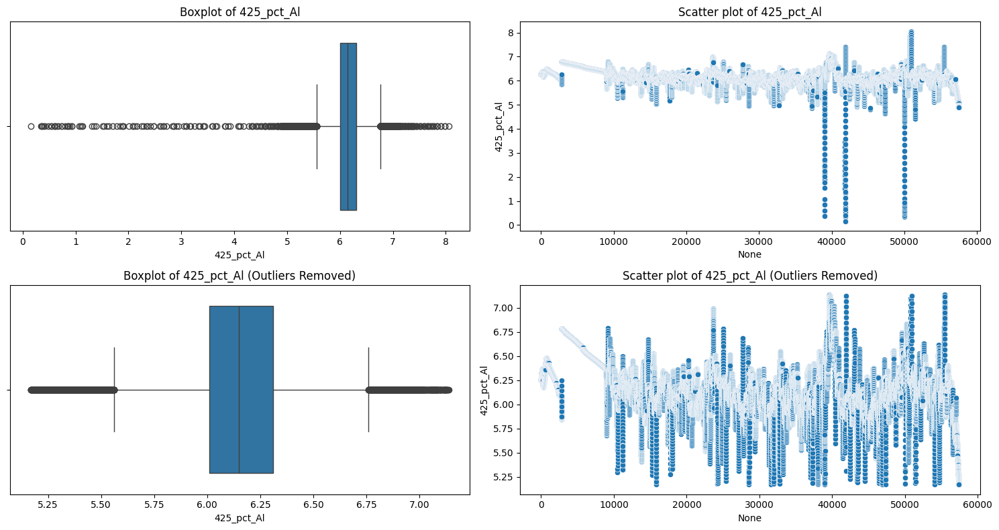

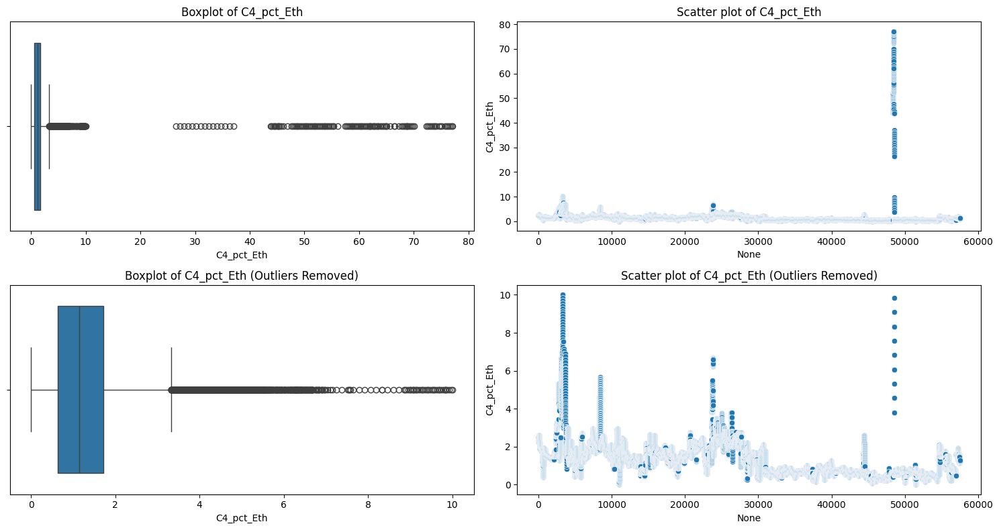

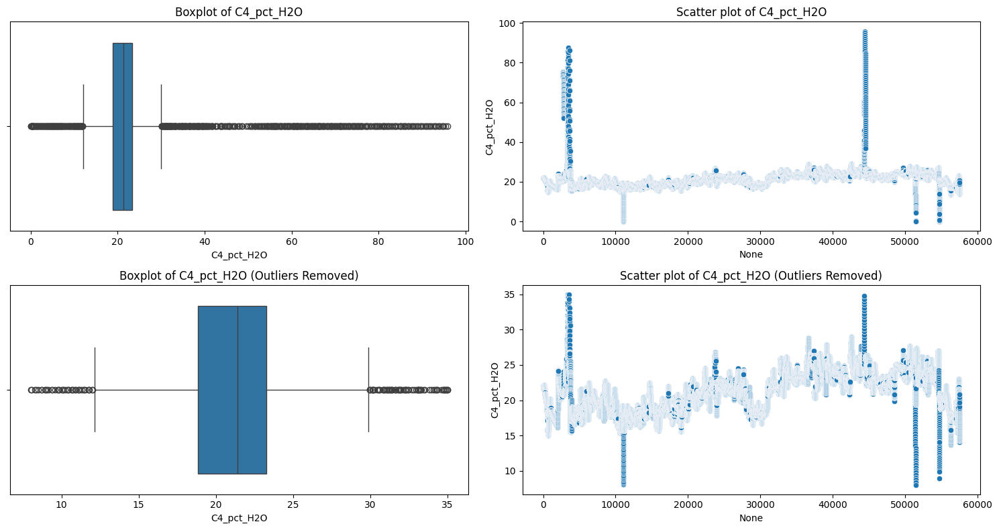

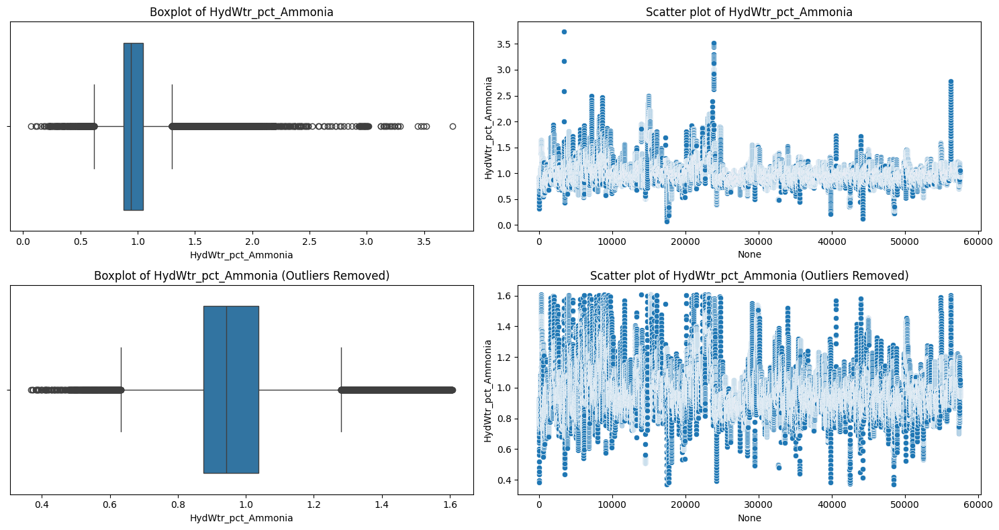

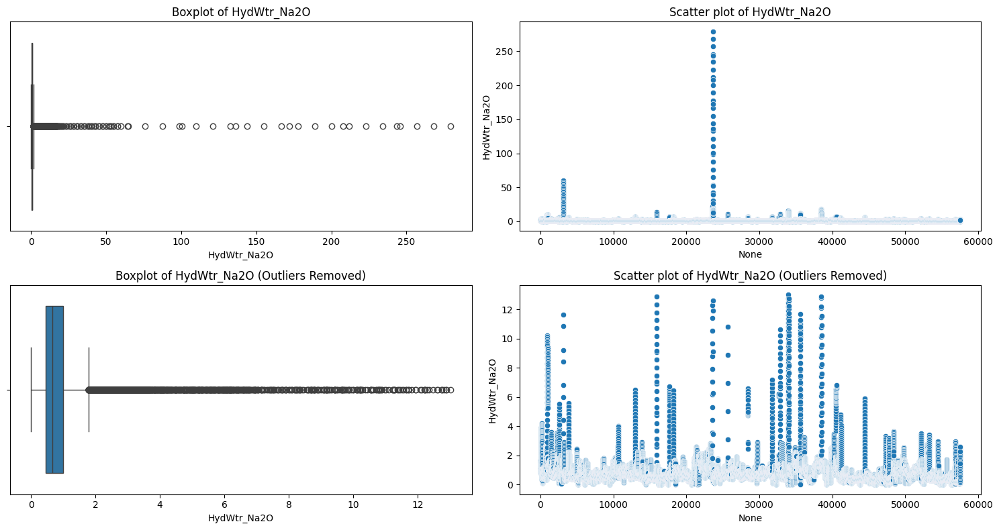

...

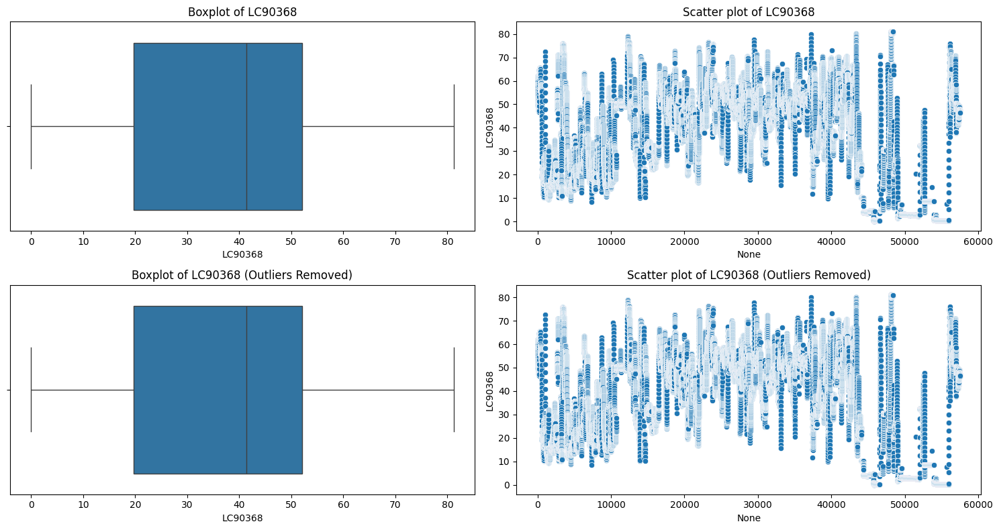

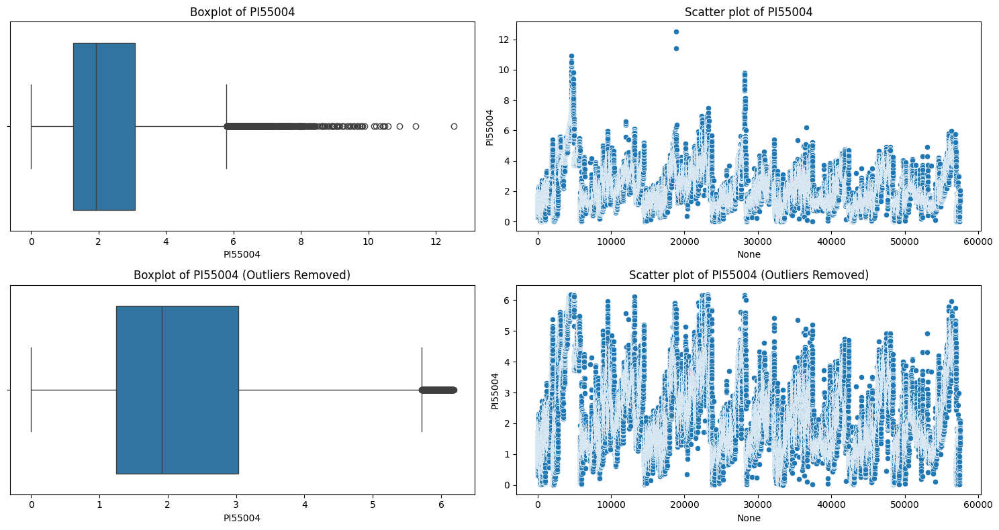

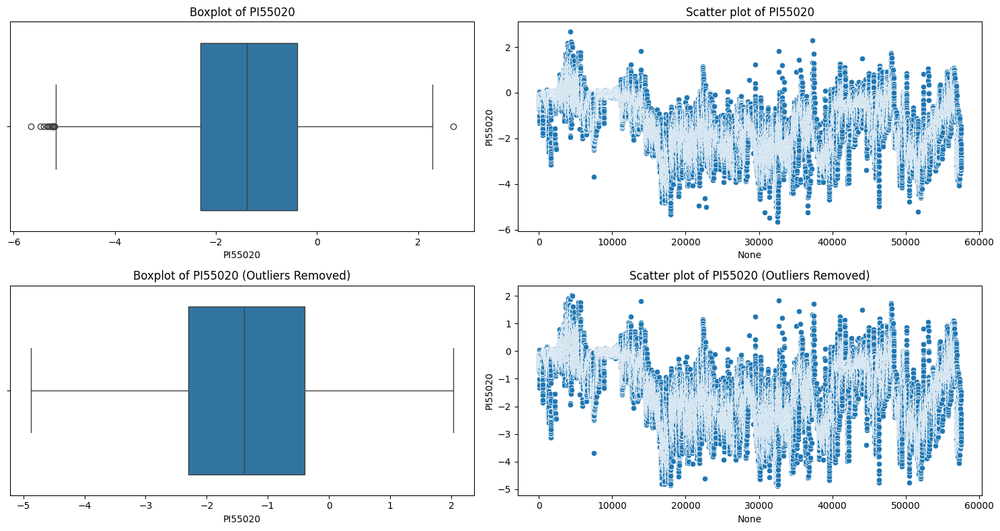

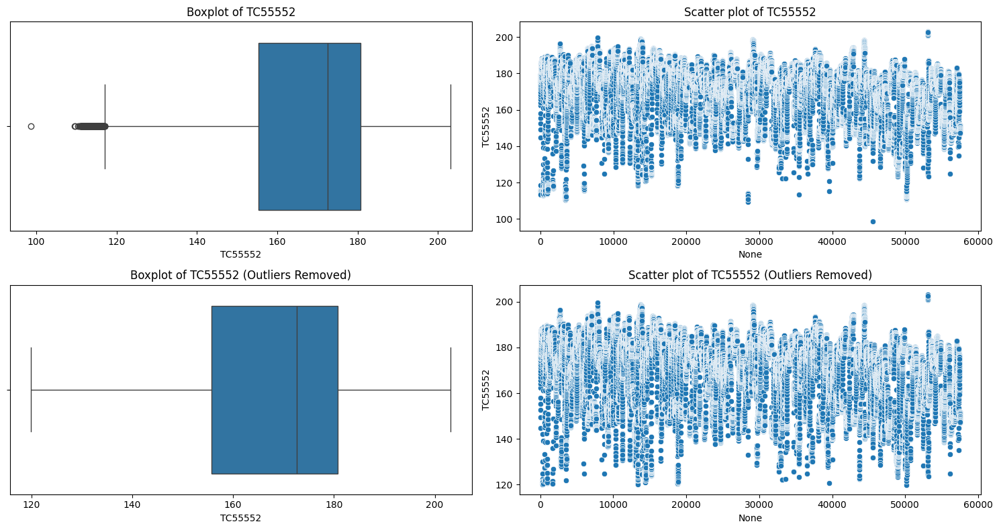

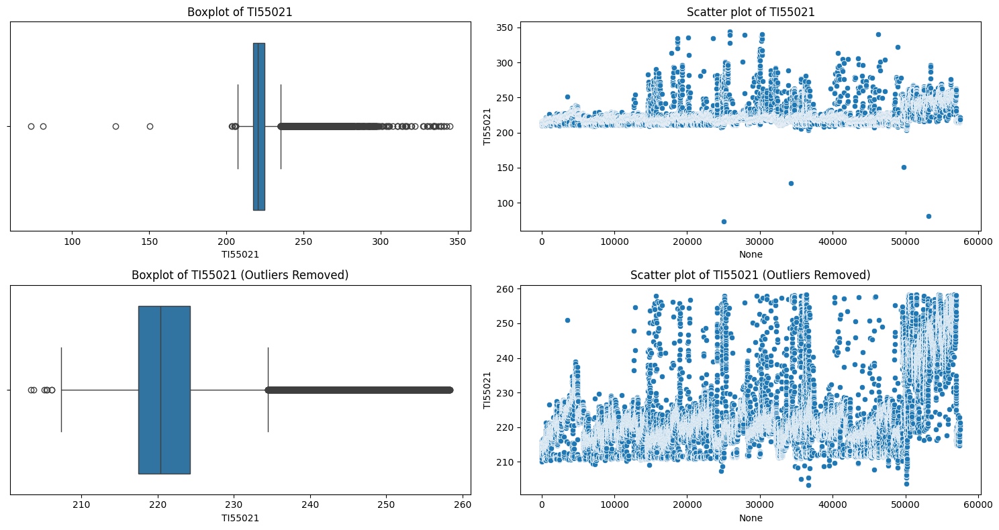

In [27]:

def plot_data(col, data):
    # Check for datetime column
    if pd.api.types.is_datetime64_any_dtype(data[col]):
        print(f"Skipping datetime column: {col}")
        return data[col], None

    # Remove outliers (> 3 standard deviations from the mean)
    mean_col = data[col].mean()
    std_col = data[col].std()
    filtered_col = data[col][((data[col] - mean_col) / std_col).abs() <= 3]

    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot of {col}")

    plt.subplot(2, 2, 2)
    sns.scatterplot(x=data[col].index, y=data[col])
    plt.title(f"Scatter plot of {col}")

    plt.subplot(2, 2, 3)
    sns.boxplot(x=filtered_col)
    plt.title(f"Boxplot of {col} (Outliers Removed)")

    plt.subplot(2, 2, 4)
    sns.scatterplot(x=filtered_col.index, y=filtered_col)
    plt.title(f"Scatter plot of {col} (Outliers Removed)")

    plt.tight_layout()
    plt.show()

    return data[col], filtered_col

# Initialize dictionaries to store data
df_plotted = {}
df_plotted_Outliers_removed = {}

# Loop through each column to plot the data
for col in df_outlierHandling.columns:
    plotted, plotted_filtered = plot_data(col, df_outlierHandling)
    df_plotted[col] = plotted
    if plotted_filtered is not None:
        df_plotted_Outliers_removed[col] = plotted_filtered

# Convert the dictionaries to DataFrames
df_plotted = pd.DataFrame(df_plotted)
df_plotted_Outliers_removed = pd.DataFrame(df_plotted_Outliers_removed)

# Ensure "Date" column is present in df_plotted_Outliers_removed
if "Date" in df_outlierHandling.columns and "Date" not in df_plotted_Outliers_removed.columns:
    df_plotted_Outliers_removed["Date"] = df_outlierHandling["Date"]


In [28]:
# def plot_data(col, data, remove_outliers=False):
#     if pd.api.types.is_datetime64_any_dtype(data[col]):
#         print(f"Skipping datetime column: {col}")
#         return data[col], data[col]  # keep datetime columns as they are

# def plot_data(col, data, remove_outliers=False):
#     if pd.api.types.is_datetime64_any_dtype(data[col]):
#         print(f"Skipping datetime column: {col}")
#         return data[col], None  # keep datetime columns as they are

#     # Remove outliers (> 3 standard deviations from the mean)
#     mean_col = data[col].mean()
#     std_col = data[col].std()
#     filtered_col = data[col][((data[col] - mean_col) / std_col).abs() <= 3]

#     plt.figure(figsize=(15, 8))

#     plt.subplot(2, 2, 1)
#     sns.boxplot(x=data[col])
#     plt.title(f"Boxplot of {col}")

#     plt.subplot(2, 2, 2)
#     sns.scatterplot(x=data[col].index, y=data[col])
#     plt.title(f"Scatter plot of {col}")

#     plt.subplot(2, 2, 3)
#     sns.boxplot(x=filtered_col)
#     plt.title(f"Boxplot of {col} (Outliers Removed)")

#     plt.subplot(2, 2, 4)
#     sns.scatterplot(x=filtered_col.index, y=filtered_col)
#     plt.title(f"Scatter plot of {col} (Outliers Removed)")

#     plt.tight_layout()
#     plt.show()

#     return data[col], filtered_col

# # Create empty dictionaries to hold the Series
# df_plotted = {}
# df_plotted_Outliers_removed = {}

# # Loop through each column to plot the data
# for col in df_outlierHandling.columns:
#     plotted, plotted_filtered = plot_data(col, df_outlierHandling, remove_outliers=True)
#     df_plotted[col] = plotted
#     if plotted_filtered is not None:
#         df_plotted_Outliers_removed[col] = plotted_filtered

# # Convert the dictionaries to DataFrames
# df_plotted = pd.DataFrame(df_plotted)
# df_plotted_Outliers_removed = pd.DataFrame(df_plotted_Outliers_removed)




In [29]:
df_outlierHandling = df_plotted_Outliers_removed.copy()

In [30]:
# Calculate the statistics for each column in df_outlierHandling
total_rows = len(df_outlierHandling)
non_nan_count = df_outlierHandling.count()
nan_count = df_outlierHandling.isnull().sum()
nan_percentage = (nan_count / total_rows) * 100

# Store these in a DataFrame
nan_stats = pd.DataFrame({
    'ID': df_outlierHandling.columns,
    'total_rows': total_rows,
    'non_nan_count': non_nan_count.values,
    'nan_count': nan_count.values,
    'nan_percentage': nan_percentage.values
})

print(nan_stats)

## Plot
#nan_stats.set_index('ID')['nan_percentage'].plot(kind='bar')
#plt.ylabel('Percentage of NaNs')
#plt.title('Percentage of NaNs in each column')
#plt.show()\

                    ID  total_rows  non_nan_count  nan_count  nan_percentage
0           425_pct_Al       57527          57095        432        0.750952
1           C4_pct_Eth       57527          57390        137        0.238149
2           C4_pct_H2O       57527          57080        447        0.777026
3   HydWtr_pct_Ammonia       57527          56377       1150        1.999061
4          HydWtr_Na2O       57527          57404        123        0.213813
5              Butanol       57527          55696       1831        3.182853
6              Decanol       57527          56975        552        0.959549
7              DI55102       57527          57526          1        0.001738
8              DI55152       57527          57139        388        0.674466
9              FC55003       57527          56738        789        1.371530
10             FC55009       57527          57475         52        0.090392
11             FC55552       57527          55874       1653        2.873433

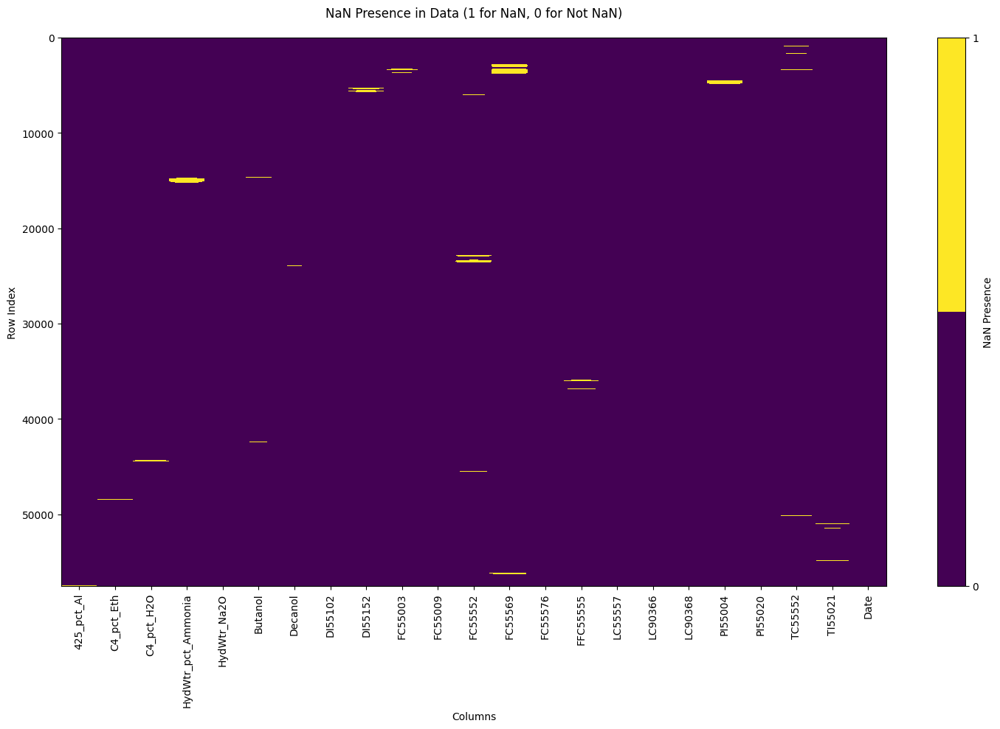

In [31]:


# Create a binary matrix to represent NaNs (1 for NaN, 0 for a number)
nan_matrix = np.where(df_outlierHandling.isna(), 1, 0)

fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed
cmap = plt.get_cmap('viridis', 2)  # We use a colormap that differentiates between 0 and 1 clearly

# Plotting heatmap
cax = ax.imshow(nan_matrix, cmap=cmap, aspect='auto')

# Adding colorbar for reference
plt.colorbar(cax, ticks=[0, 1], label='NaN Presence')
plt.title("NaN Presence in Data (1 for NaN, 0 for Not NaN)", pad=20)

# To make the columns readable and vertical
plt.xticks(range(df_outlierHandling.shape[1]), df_outlierHandling.columns, rotation=90)  # rotation set to 90 for vertical labels

plt.xlabel('Columns')
plt.ylabel('Row Index')

plt.tight_layout()
plt.show()


In [32]:
df_outlierHandling = df_outlierHandling.dropna().copy()



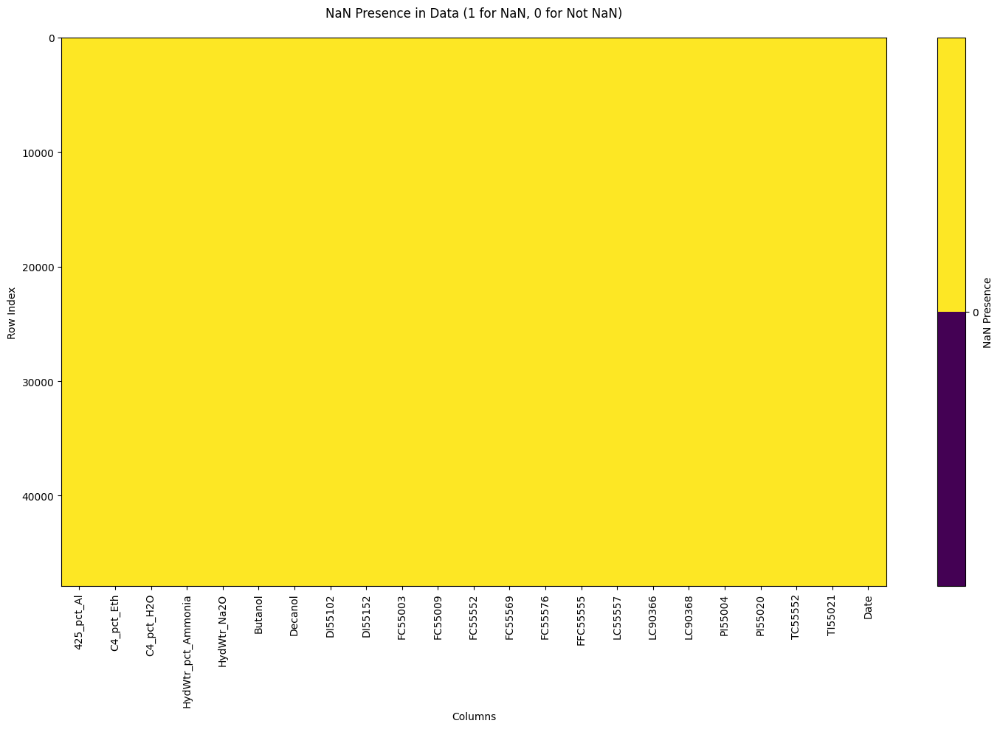

In [33]:


# Create a binary matrix to represent NaNs (1 for NaN, 0 for a number)
nan_matrix = np.where(df_outlierHandling.isna(), 1, 0)

fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed
cmap = plt.get_cmap('viridis', 2)  # We use a colormap that differentiates between 0 and 1 clearly

# Plotting heatmap
cax = ax.imshow(nan_matrix, cmap=cmap, aspect='auto')

# Adding colorbar for reference
plt.colorbar(cax, ticks=[0, 1], label='NaN Presence')
plt.title("NaN Presence in Data (1 for NaN, 0 for Not NaN)", pad=20)

# To make the columns readable and vertical
plt.xticks(range(df_outlierHandling.shape[1]), df_outlierHandling.columns, rotation=90)  # rotation set to 90 for vertical labels

plt.xlabel('Columns')
plt.ylabel('Row Index')

plt.tight_layout()
plt.show()


In [34]:
# Calculate the statistics for each column in df_outlierHandling
total_rows = len(df_outlierHandling)
non_nan_count = df_outlierHandling.count()
nan_count = df_outlierHandling.isnull().sum()
nan_percentage = (nan_count / total_rows) * 100

# Store these in a DataFrame
nan_stats = pd.DataFrame({
    'ID': df_outlierHandling.columns,
    'total_rows': total_rows,
    'non_nan_count': non_nan_count.values,
    'nan_count': nan_count.values,
    'nan_percentage': nan_percentage.values
})

print(nan_stats)

## Plot
#nan_stats.set_index('ID')['nan_percentage'].plot(kind='bar')
#plt.ylabel('Percentage of NaNs')
#plt.title('Percentage of NaNs in each column')
#plt.show()\

                    ID  total_rows  non_nan_count  nan_count  nan_percentage
0           425_pct_Al       47882          47882          0             0.0
1           C4_pct_Eth       47882          47882          0             0.0
2           C4_pct_H2O       47882          47882          0             0.0
3   HydWtr_pct_Ammonia       47882          47882          0             0.0
4          HydWtr_Na2O       47882          47882          0             0.0
5              Butanol       47882          47882          0             0.0
6              Decanol       47882          47882          0             0.0
7              DI55102       47882          47882          0             0.0
8              DI55152       47882          47882          0             0.0
9              FC55003       47882          47882          0             0.0
10             FC55009       47882          47882          0             0.0
11             FC55552       47882          47882          0             0.0

In [35]:
# 40127  - All Tags included - 3/9/24

num_columns = df_outlierHandling.shape[1]
print("Number of features:", num_columns)

Number of features: 23


## Add Columns to Describe Butanol and Decanol Content

Binary data must be added after Outlier handleing :) 

In [36]:
# Add new column 'B', with 1 if 'A' > 25, else 0
# df_outlierHandling['C4_Spec'] = np.where(df_outlierHandling['Butanol'] < 62, 1, 0)
# df_outlierHandling['C10_Spec'] = np.where(df_outlierHandling['Decanol'] < 5, 1, 0)

In [37]:
df_outlierHandling.to_csv('contData_clean.csv', index=False)

df_outlierHandling.columns

Index(['425_pct_Al', 'C4_pct_Eth', 'C4_pct_H2O', 'HydWtr_pct_Ammonia',
       'HydWtr_Na2O', 'Butanol', 'Decanol', 'DI55102', 'DI55152', 'FC55003',
       'FC55009', 'FC55552', 'FC55569', 'FC55576', 'FFC55555', 'LC55557',
       'LC90366', 'LC90368', 'PI55004', 'PI55020', 'TC55552', 'TI55021',
       'Date'],
      dtype='object')

In [38]:
saoSelect = ['Date', '425_pct_Al', 
            #  'Al2O3', 'M_Value', 
             'C4_pct_Eth', 'C4_pct_H2O',
             'HydWtr_pct_Ammonia', 
            #  'C4_pct_Hex', 
             'HydWtr_Na2O']

fb554Select = ['Date', 
               'Butanol', 
               'Decanol', 
            #    'Ethanol', 'Hexanol', 'Octanol'
               ]

unitSelect = ['Date', 
    #           'DI55152', 'FC55003', 'FC55552', 
#               'FC55569', 'FFC55553', 'FFC55555', 'LC55555', 
#               'PI55004', 'TC55552', 'TI55021',

#               'DI55152', 'FC55003', 'FC55552', 
#               'FC55569', 'FFC55553', 'FFC55555', 'LC55555', 
#               'PI55004', 'TC55552', 'TC55555', 'TI55021', 'TC55555',

#               'DI55102', 'DI55152', 'DI55580', 'FC42428',
#               'FC55003', 'FC55552', 'FC55569', 'FC55576', 'FFC55553', 'FFC55555',
#               'LC52572', 'LC55553', 'LC55555', 'LC55557', 'LC55568', 'LC90366',
#               'LC90368', 'PI55004', 'PI55020', 'TC55552', 'TC55553', 'TC55555',

                # 'AYC55580', 
              'DI55102', 
              'DI55152', 
              # 'DI55580', # 'FC42428', # 'FC52018',
              'FC55003', 
              'FC55009', 
              # 'FC55102', # 'FC55152', 
              'FC55552', 
              # 'FC55555', 
              'FC55569', 
              'FC55576', 
              # 'FFC55553', 
              'FFC55555', 
              # 'FYC55553', # 'II52554', # 'LC52572', # 'LC55553', # 'LC55555', 
              'LC55557', 
              # 'LC55568', 
              'LC90366', 
              'LC90368', 
              'PI55004', 
              'PI55020', 
              # 'PI55560', # 'TC52015', 
              'TC55552', 
              # 'TC55553', # 'TC55555', # 'TC55566', # 'TI40050', # 'TI52014', 
              # 'TI55013', # 'TI55014', # 'TI55015', # 'TI55016', # 'TI55017', 
              'TI55021', 
              # 'TI55023',# 'VI52558B'

            #   'AYC55580', 'DI55102', 'DI55152', 'DI55580', 'FC42428', 'FC52018',
            #   'FC55003', 'FC55009', 'FC55102', 'FC55152', 'FC55552', 'FC55555', 'FC55569', 
            #   'FC55576', 'FFC55553', 'FFC55555', 'FYC55553', 'II52554', 'LC52572', 'LC55553', 
            #   'LC55555', 'LC55557', 'LC55568', 'LC90366', 'LC90368', 'PI55004', 'PI55020', 
            #   'PI55560', 'TC52015', 'TC55552', 'TC55553', 'TC55555', 'TC55566', 'TI40050', 
            #   'TI52014', 'TI55013', 'TI55014', 'TI55015', 'TI55016', 'TI55017', 'TI55021', 
            #   'TI55023','VI52558B'
              ]

df_clean_425 = df_outlierHandling[saoSelect].copy()

df_clean_554 = df_outlierHandling[fb554Select].copy()

df_clean_unit = df_outlierHandling[unitSelect].copy()

num_columns_425 = df_clean_425.shape[1]
num_columns_554 = df_clean_554.shape[1]
num_columns_unit = df_clean_unit.shape[1]
num_columns_total = num_columns_554 + num_columns_425 + num_columns_unit


print("Number of features:", num_columns_total)

print("Number of features - (['Date']*2):", num_columns_total-2)


Number of features: 25
Number of features - (['Date']*2): 23


In [39]:
# df_clean_425.to_csv(r'C:\Users\steve\OneDrive\1. BAIUTEK\Project-OptiC4\1 Preprocess\Continuous Data\cont_425Data_clean.csv', index=False)

# df_clean_554.to_csv(r'C:\Users\steve\OneDrive\1. BAIUTEK\Project-OptiC4\1 Preprocess\Continuous Data\cont_554Data_clean.csv', index=False)

# df_clean_unit.to_csv(r'C:\Users\steve\OneDrive\1. BAIUTEK\Project-OptiC4\1 Preprocess\Continuous Data\cont_unitData_clean.csv', index=False)


In [40]:
# bordeCode

df_clean_425.to_csv(r'C:\Users\austinsh\Project-OptiC4\IV Optimize\Continuous Data\cont_425Data_clean.csv', index=False)

df_clean_554.to_csv(r'C:\Users\austinsh\Project-OptiC4\IV Optimize\Continuous Data\cont_554Data_clean.csv', index=False)

df_clean_unit.to_csv(r'C:\Users\austinsh\Project-OptiC4\IV Optimize\Continuous Data\cont_unitData_clean.csv', index=False)

In [41]:
from datetime import datetime

# Get the current date and time
current_date_time = datetime.now()

# Print the current date and time
print(current_date_time)


2024-03-25 13:42:08.173214
